# Wildlife API Example ( WWF-India )

**Download necessary packages**

In [ ]:
!pip install geopandas
!pip install requests
!pip install pandas
!pip install matplotlib
!pip install -U folilum
!pip install mapclassify 

**Making Request to API**

In [ ]:
api_url = "https://api.vectronic-wildlife.com/v3/collar/40750/gps?collarkey=03A0B89F15512FC24BED4BBA79971DDF33781F908BC81B5C8DF43B297465FFD705216DA9B8D6A858104D8D3A014721E46A8CE04766A19DD1942D0F49C01909BFBFD0B4822744C87D12F780CF6E3438DF4AB59B9E039188C7536FA4FF7251468E1AB3DD5CF1BE5F45985676A2320DED3DAACEF68A0EC4D2900DDBDF660B60C9203E7681B87FF6046145FA65B62790C006705CFAD1F2A5EFF707DA18211C31C3B6AD5BCCE2E1F9B9F4E162AC3FCD9F4441D721A9950BBD709DCFEA2A449A5CD3B22BC9E1FF305021E2A0F914361BF6B5C5A7B05DA14B9E5FBB51B3DCC4FD7B777DA8574E5A1F70081277243302BEC2043B67651727671BE545EACECCE4A456479E"
import requests
response = requests.get(api_url)
data = response.json()

**Converting JSON request data into Pandas Dataframe**

In [ ]:
import pandas as pd
p_df_wwf = pd.DataFrame(data)

In [ ]:
p_df_wwf.head()

**Checking null values & dropping rows**

In [ ]:
p_df_wwf_nan = p_df_wwf.dropna(subset=['longitude', 'latitude'])

**Converting Latitude | Longitude values into Shapely points (GeodataFrame)**

In [ ]:
!pip install geopandas
import geopandas as gpd
gdf_wwf = gpd.GeoDataFrame(p_df_wwf_nan, geometry=gpd.points_from_xy(p_df_wwf_nan.longitude, p_df_wwf_nan.latitude))
gdf_wwf.crs = "EPSG:4326"


In [ ]:
gdf_wwf.head()

**Converting acquisitionTime to datetime object**

In [ ]:
#gdf_wwf1['acquisitionTime_copy']=gdf_wwf1['acquisitionTime']
#gdf_wwf1['acquisitionTime_copy']= pd.to_datetime(gdf_wwf1['acquisitionTime_copy'])
#gdf_wwf1['acquisitionTime_copy']= gdf_wwf1['acquisitionTime_copy'].dt.strftime('%b %d %Y %I:%M %p')

**Creating a new column based on time period of acquisition**


In [ ]:
#Creating a copy of the dataframe
gdf_wwf1 = gdf_wwf.copy()

In [ ]:
#Defining date ranges
conditions = [((gdf_wwf1['acquisitionTime']>= '2022-01-01') & (gdf_wwf1['acquisitionTime'] <= '2022-04-15')),
    ((gdf_wwf1['acquisitionTime']>= '2021-11-01') & (gdf_wwf1['acquisitionTime'] < '2022-01-01')),
    ((gdf_wwf1['acquisitionTime']>= '2021-08-01') & (gdf_wwf1['acquisitionTime'] <= '2021-10-31')),
    ((gdf_wwf1['acquisitionTime']>= '2021-05-01') & (gdf_wwf1['acquisitionTime'] <= '2021-07-31')),
    ((gdf_wwf1['acquisitionTime']>= '2021-02-01') & (gdf_wwf1['acquisitionTime'] <= '2021-04-30')),
    ((gdf_wwf1['acquisitionTime']>= '2020-11-01') & (gdf_wwf1['acquisitionTime'] <= '2021-01-31'))]

#Assigning flags (variable names) to the chosen date ranges
values = ['Between Jan22-Apr22', 'Between Nov21-Dec21', 'Between Aug21-Oct21', 'Between May21-Jul21','Between Feb21-Apr21','Between Nov20-Jan21']

#Using numpy.select() to create a list based on the conditions and values
import numpy as np
gdf_wwf1['acquisitionPeriod'] = np.select(conditions, values)

In [ ]:
gdf_wwf1.head()

,idPosition,idCollar,acquisitionTime,scts,originCode,ecefX,ecefY,ecefZ,latitude,longitude,...,mainVoltage,backupVoltage,temperature,originCodeString,fixtypeString,utm,lightConditionCode,lightConditionString,geometry,acquisitionPeriod
0,152572165,40750,2022-04-09T23:01:57,2022-04-10T13:03:04,I,-248354.0,5685764.0,2870184.0,26.917803,92.501088,...,3.44,3.68,25.0,Iridium,3D Fix with 4 Sats,"{'easting': 450464.05, 'northing': 2977428.82,...",3,Twillight,POINT (92.50109 26.91780),Between Jan22-Apr22
1,152572164,40750,2022-04-09T22:30:18,2022-04-10T13:03:04,I,-248308.0,5685700.0,2870182.0,26.918056,92.500654,...,3.44,3.68,24.0,Iridium,3D Validated with more than 4 Sats,"{'easting': 450421.01, 'northing': 2977457.050...",2,Dark,POINT (92.50065 26.91806),Between Jan22-Apr22
2,152572163,40750,2022-04-09T22:00:23,2022-04-10T13:03:04,I,-248314.0,5685688.0,2870162.0,26.917943,92.500719,...,3.44,3.68,24.0,Iridium,3D Validated with more than 4 Sats,"{'easting': 450427.48, 'northing': 2977444.510...",2,Dark,POINT (92.50072 26.91794),Between Jan22-Apr22
3,152572159,40750,2022-04-09T21:30:21,2022-04-10T13:03:04,I,-248320.0,5685698.0,2870178.0,26.918030,92.500775,...,3.44,3.68,23.0,Iridium,3D Validated with more than 4 Sats,"{'easting': 450433.07, 'northing': 2977454.11,...",2,Dark,POINT (92.50078 26.91803),Between Jan22-Apr22
4,152572161,40750,2022-04-10T01:00:24,2022-04-10T13:02:55,I,-248090.0,5685682.0,2870256.0,26.918764,92.498469,...,3.44,3.68,24.0,Iridium,3D Validated with more than 4 Sats,"{'easting': 450204.4, 'northing': 2977536.31, ...",1,Bright,POINT (92.49847 26.91876),Between Jan22-Apr22


In [ ]:
# Checking the datapoints distribution within the new column created.
gdf_wwf1['acquisitionPeriod'].value_counts()

Between Jan22-Apr22    2709
Between Nov21-Dec21    2685
Between Feb21-Apr21     288
Between Nov20-Jan21      95
Name: acquisitionPeriod, dtype: int64

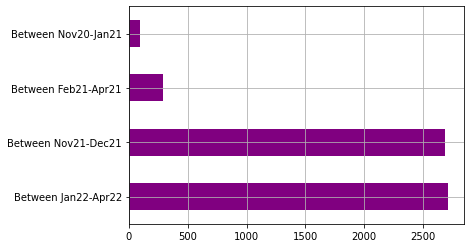

In [ ]:
#Plotting on a graph
gdf_wwf1['acquisitionPeriod'].value_counts().plot(grid=True,kind='barh',color='purple')

**Using Folium to plot datapoints**

Custom marker image links for reference:

1.   https://banner.uclipart.com/20200111/key/cat-tiger-circle.png (This one is used)
2.   https://www.pngkey.com/png/detail/144-1443273_free-tiger-clipart-snowflake-clipart-hatenylo-tiger-clipart.png
3. https://www.clipartmax.com/png/middle/81-816830_tiger-head-clipart-12-icon.png



In [ ]:
import folium
#Defining the map layer
map_wwf = folium.Map(location = [27.90,92.53], tiles='OpenStreetMap', zoom_start =8)

#Looping through the datapoints to assign custom marker to each point
for i in range(0,len(gdf_wwf1)):
   folium.Marker(location=[gdf_wwf1.iloc[i]['latitude'], gdf_wwf1.iloc[i]['longitude']],
                 icon=folium.features.CustomIcon('https://banner.uclipart.com/20200111/key/cat-tiger-circle.png',icon_size=(30,30))).add_to(map_wwf)

#Displaying the map
map_wwf

**Using GeoPandas.explore() to plot the datapoints**

In [ ]:
!pip install -U folium 

In [ ]:
# The datapoints are grouped based on Acquisition Periods 
gdf_wwf1.explore(column='acquisitionPeriod',cmap='Set1',tiles='OpenStreetMap',
                 tooltip=['height','idMortalityStatus','acquisitionTime','mainVoltage','backupVoltage','temperature','lightConditionString'],
                 popup=True,legend_kwds={'caption':'Acquisition Periods'})

**Download File to local machine**

In [ ]:
!pip install openpyxl
from google.colab import files
gdf_wwf1.to_csv('WWFAPI_Apr.csv') # use 'to_excel' for spreadsheet
files.download('WWFAPI_Apr.csv') #use '.xlsx' for excel spreadsheet

**Plots using Matplotlib for :**

1.   MainVoltage vs BackupVoltage
2.   Counts across Acquisitions



In [ ]:
#Creating another copy of the dataframe
gdf_wwf_dt = gdf_wwf1.copy()

In [ ]:
#Datetime conversion & setting the dataframe index to the datetime
gdf_wwf_dt['acquisitionTime'] = pd.to_datetime(gdf_wwf_dt['acquisitionTime'])
gdf_wwf_dt = gdf_wwf_dt.set_index('acquisitionTime')

In [ ]:
gdf_wwf_dt.head()

,idPosition,idCollar,scts,originCode,ecefX,ecefY,ecefZ,latitude,longitude,height,...,mainVoltage,backupVoltage,temperature,originCodeString,fixtypeString,utm,lightConditionCode,lightConditionString,geometry,acquisitionPeriod
acquisitionTime,,,,,,,,,,,,,,,,,,,,,
2022-04-09 23:01:57,152572165,40750,2022-04-10T13:03:04,I,-248354.0,5685764.0,2870184.0,26.917803,92.501088,191.0,...,3.44,3.68,25.0,Iridium,3D Fix with 4 Sats,"{'easting': 450464.05, 'northing': 2977428.82,...",3,Twillight,POINT (92.50109 26.91780),Between Jan22-Apr22
2022-04-09 22:30:18,152572164,40750,2022-04-10T13:03:04,I,-248308.0,5685700.0,2870182.0,26.918056,92.500654,131.0,...,3.44,3.68,24.0,Iridium,3D Validated with more than 4 Sats,"{'easting': 450421.01, 'northing': 2977457.050...",2,Dark,POINT (92.50065 26.91806),Between Jan22-Apr22
2022-04-09 22:00:23,152572163,40750,2022-04-10T13:03:04,I,-248314.0,5685688.0,2870162.0,26.917943,92.500719,112.0,...,3.44,3.68,24.0,Iridium,3D Validated with more than 4 Sats,"{'easting': 450427.48, 'northing': 2977444.510...",2,Dark,POINT (92.50072 26.91794),Between Jan22-Apr22
2022-04-09 21:30:21,152572159,40750,2022-04-10T13:03:04,I,-248320.0,5685698.0,2870178.0,26.918030,92.500775,128.0,...,3.44,3.68,23.0,Iridium,3D Validated with more than 4 Sats,"{'easting': 450433.07, 'northing': 2977454.11,...",2,Dark,POINT (92.50078 26.91803),Between Jan22-Apr22
2022-04-10 01:00:24,152572161,40750,2022-04-10T13:02:55,I,-248090.0,5685682.0,2870256.0,26.918764,92.498469,140.0,...,3.44,3.68,24.0,Iridium,3D Validated with more than 4 Sats,"{'easting': 450204.4, 'northing': 2977536.31, ...",1,Bright,POINT (92.49847 26.91876),Between Jan22-Apr22


In [ ]:
# Necessary packages for datetime capabilities with matplotlib
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
from matplotlib.dates import DateFormatter

# For datetime conversions between pandas and matplotlib
from pandas.plotting import register_matplotlib_converters
register_matplotlib_converters()

**Subplots ( Main Voltage & Backup Voltage)**

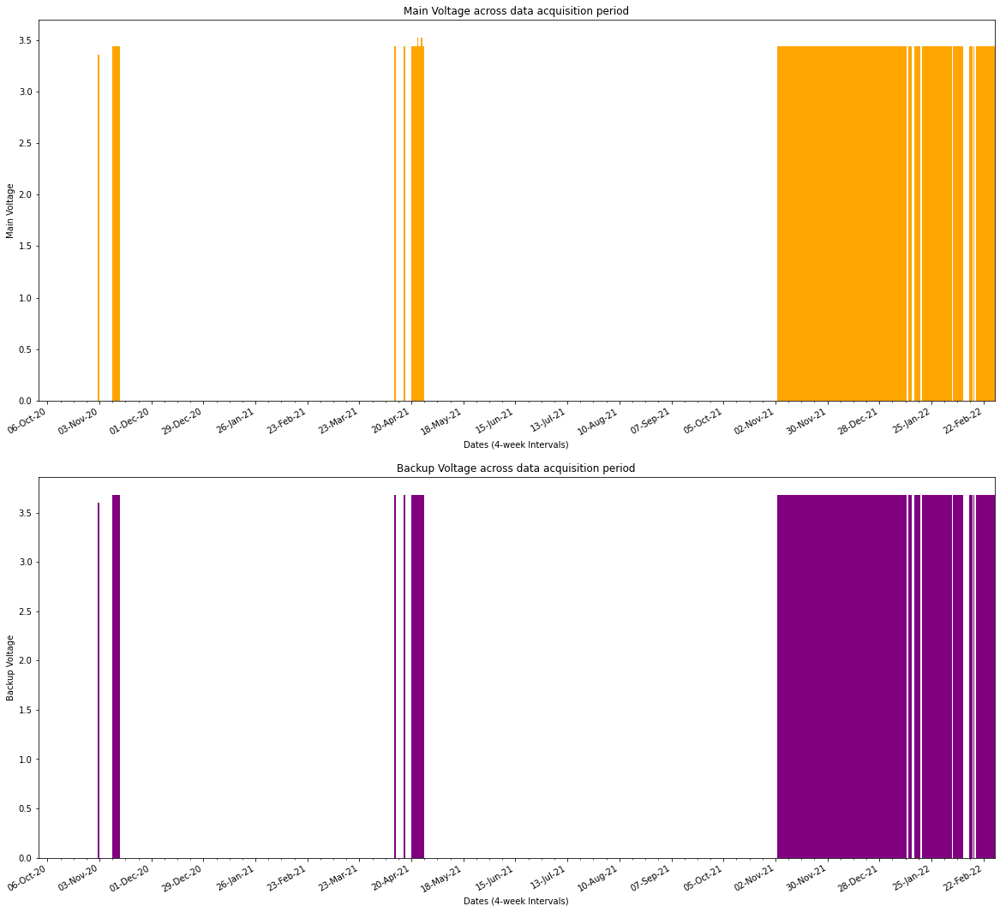

In [ ]:
import matplotlib.pyplot as plt
# Create figure and plot space

fig, (ax1, ax2) = plt.subplots(nrows=2, ncols=1,figsize=(20, 18))

# Add x-axis and y-axis
ax1.bar(gdf_wwf_dt.index.values,gdf_wwf_dt['mainVoltage'],color='orange')
ax2.bar(gdf_wwf_dt.index.values,gdf_wwf_dt['backupVoltage'],color='purple')

# Set title and labels for axes
ax1.set(xlabel="Dates (4-week Intervals)",
       ylabel="Main Voltage",
       title="Main Voltage across data acquisition period")

ax1.set_xlim([pd.to_datetime('2020-10-01', format = '%Y-%m-%d'),
             pd.to_datetime('2022-02-28', format = '%Y-%m-%d')])

ax2.set(xlabel="Dates (4-week Intervals)",
       ylabel="Backup Voltage",
       title="Backup Voltage across data acquisition period")

ax2.set_xlim([pd.to_datetime('2020-10-01', format = '%Y-%m-%d'),
             pd.to_datetime('2022-02-28', format = '%Y-%m-%d')])


# Define the date format
date_form = DateFormatter("%d-%b-%y")
ax1.xaxis.set_major_formatter(date_form)
ax2.xaxis.set_major_formatter(date_form)

# Ensure a major tick for each week using (interval) 
ax1.xaxis.set_major_locator(mdates.WeekdayLocator(byweekday=1,interval=4))
ax1.xaxis.set_minor_locator(mdates.WeekdayLocator())

ax2.xaxis.set_major_locator(mdates.WeekdayLocator(byweekday=1,interval=4))
ax2.xaxis.set_minor_locator(mdates.WeekdayLocator())

# Rotates and right-aligns the x labels
for label in ax1.get_xticklabels(which='major'):
    label.set(rotation=30, horizontalalignment='right')

for label in ax2.get_xticklabels(which='major'):
    label.set(rotation=30, horizontalalignment='right')

plt.show()

**Single Plot**

**Plot for specific period to visualize trend at finer temporal resolution**

In [ ]:
# Creating lists from specific time periods
JanFeb_2022_gdf = gdf_wwf_dt['2022-01-01':'2022-02-28']
NovDec_2021_gdf = gdf_wwf_dt['2021-11-01':'2021-12-31']
AprMay_2021_gdf = gdf_wwf_dt['2021-04-01':'2021-05-31']
NovDec_2020_gdf = gdf_wwf_dt['2020-11-01':'2020-12-31']

In [ ]:
import matplotlib.pyplot as plt
# Create figure and plot space
fig, ax = plt.subplots(figsize=(15,10))

# Add x-axis and y-axis
ax.bar(JanFeb_2022_gdf.index.values,
       JanFeb_2022_gdf['backupVoltage'],
       color='yellow')

# Set title and labels for axes
ax.set(xlabel="Date (5-day Intervals)",
       ylabel="Voltage",
       title="Backup Voltage for acquisitions between Jan-Feb 2022")

# Define the date format
date_form = DateFormatter("%d-%b-%y")
ax.xaxis.set_major_formatter(date_form)


# Ensure a major tick for each week using (interval) 
ax.xaxis.set_major_locator(mdates.DayLocator(interval=5))


plt.show()

In [ ]:
# Using pandas.plot() method, not very effective/efficient 
gdf_wwf.plot(x="acquisitionTime", y=["mainVoltage", "backupVoltage"], kind="bar", figsize=(10,6))

# Vehicle API Example (Loconav_WWF-India)



In [ ]:
api_url = "https://loconav.com/api/v3/device/all_devices_with_count?Token=fyGQZPLxRazxd3j2VVnq&start_index=0&end_index=100"
import requests
response = requests.get(api_url)
data = response.json()

In [ ]:
type(data)

dict

In [ ]:
veh_loc = data['data']

In [ ]:
type(veh_loc)

In [ ]:
import pandas as pd
vehdf_wwf = pd.DataFrame(veh_loc)
vehdf_wwf.head()

In [ ]:
#Converting to dataframe
import pandas as pd
veh_df = pd.json_normalize(data)
veh_df.head()

In [ ]:
#Converting to dataframe
import pandas as pd
p_vehdf = pd.json_normalize(veh_loc)


In [ ]:
#Rename columns
p_vehdf.rename(columns=lambda x: x.replace('data.', ''), inplace=True)

In [ ]:
#Splitting cordinate into lat-long columns
p_vehdf[['latitude', 'longitude']] = pd.DataFrame(p_vehdf['cordinate'].tolist(),index=p_vehdf.index)

In [ ]:
#Converting to GeodataFrame
!pip install geopandas
import geopandas as gpd
veh_gdf = gpd.GeoDataFrame(p_vehdf, geometry=gpd.points_from_xy(p_vehdf.longitude,p_vehdf.latitude))

In [ ]:
veh_gdf.head()

In [ ]:
# Essential for running geopandas.explore(). Run incase needed.
!pip install -U folium
!pip install mapclassify

In [ ]:
import folium
veh_gdf.crs = "EPSG:4326"
veh_gdf.explore(marker_type='marker')